Что день грядущий нам готовит? Построение прогноза временного ряда с использованием изученных методов.
Цель: В этом домашнем задании будет заниматься очень интересными прогнозами, которые вполне могут быть полезны для организации работы метро - попробуем построить модель, которая предсказывает, сколько пассажиров будут им пользоваться в ближайшее время.
Подготовка

1. Скачиваем данные по загруженности метро вот отсюда https://archive.ics.uci.edu/ml/datasets/Metro+Interstate+Traffic+Volume
2. Проводим базовый EDA, вам понадобятся только 4 столбца датасета - traffic_volume (наша целевая переменная), date_time, holiday (является ли день некоторым праздником) и temp (температура воздуха)
3. По результатам EDA убеждаемся, что в этом временном ряду во-первых, есть дубликаты, а во-вторых, нарушена равномерность временных интервалов, т.е. не все значения отстоят друг от друга на 1 час - дубликаты удаляем, а временные интервалы выравниваем и заполняем пропуски при помощи линейной интерполяции (подсказка - в этом вам помогут функции pd.date_range, и interpolate, пример можно найти здесь - https://pandas.pydata.org/pandas-docs/stable/reference/api/pandas.Series.interpolate.html) 

Моделирование

Теперь, когда ряд выглядит более-менее адекватно, настало время прогнозировать. Нашей целью будет построить модель, которая способна прогнозировать загрузку метро на ближайшую неделю (т.е, так как данные у нас дневные, модель должна предсказывать на 24*7 точек вперёд). 
1. Отложите последние две недели в датасете для тестирования вашей модели - на этих данных вы будете проверять финальное качество всех моделек
2. Теперь у вас осталось еще много-много наблюдений во временном ряду, исходя из графиков, трендов и т.д., попробуйте предположить, какие исторические данные действительно будут релевантны для прогнозов текущих значений, возможно, предыдущие три года уже не так сильно влияют на следующую неделю и можно значительную часть данных просто выкинуть
3. Генерируем дополнительные признаки из индекса, особенно нужен день недели и час дня
4. Строим baseline прогноз - по тем данным, которые вы решили оставить для обучения модели, посчитайте средние значения по часам и по дням (вам поможет data.groupby(["weekday", "hour"])["traffic_volume"].mean() и используйте эти значения в качестве прогноза на отложенную выборку - посчитайте метрики качества, которые вы посчитаете нужными
5. А теперь свободное творчество - попробуйте построить разные модели, которые мы с вами разбирали, и побить качество базового прогноза. 

Несколько советов 
- для SARIMA модели имеет смысл указать недельную сезонность (т.е. 24*7), чтобы она учла падения по выходным
- попробуйте использовать температуру воздуха, как признак, в этом случае можно отдельно спрогнозировать температуру (например, используя SARIMA), а затем воспользоваться этими предсказаниями, когда будете делать прогноз для отложенной части выборки

6. Наконец, когда вы подберете модель, устраивающую вас по качеству на отложенной выборке, используйте эту выборку для построения прогноза на следующую неделю и попробуйте построить доверительные интервалы для этого прогноза
7. Теперь вы круто разбираетесь в прогнозировании и временных рядах :) 

In [1]:
import pandas as pd
import numpy as np

from plotly.offline import init_notebook_mode, plot, iplot
import plotly.graph_objs as go
import plotly.express as px
init_notebook_mode(connected=True)

import matplotlib.pyplot as plt
%matplotlib inline

import warnings
warnings.filterwarnings('ignore')

def pprint(text):
    print('\033[1m' + '\033[92m' + '\033[4m' + text + '\033[0m')

# Preprocessing and EDA

In [2]:
data0 = pd.read_csv('Metro_Interstate_Traffic_Volume.csv', parse_dates=['date_time'])

In [3]:
data0.head()

,holiday,temp,rain_1h,snow_1h,clouds_all,weather_main,weather_description,date_time,traffic_volume
0,None,288.28,0.0,0.0,40,Clouds,scattered clouds,2012-10-02 09:00:00,5545
1,None,289.36,0.0,0.0,75,Clouds,broken clouds,2012-10-02 10:00:00,4516
2,None,289.58,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 11:00:00,4767
3,None,290.13,0.0,0.0,90,Clouds,overcast clouds,2012-10-02 12:00:00,5026
4,None,291.14,0.0,0.0,75,Clouds,broken clouds,2012-10-02 13:00:00,4918


In [4]:
data1 = data0[['traffic_volume', 'date_time', 'holiday', 'temp']].copy()

In [5]:
data1.head()

,traffic_volume,date_time,holiday,temp
0,5545,2012-10-02 09:00:00,None,288.28
1,4516,2012-10-02 10:00:00,None,289.36
2,4767,2012-10-02 11:00:00,None,289.58
3,5026,2012-10-02 12:00:00,None,290.13
4,4918,2012-10-02 13:00:00,None,291.14


In [6]:
data1['date_time'].min(), data1['date_time'].max()

(Timestamp('2012-10-02 09:00:00'), Timestamp('2018-09-30 23:00:00'))

In [7]:
fig = px.line(data1, x='date_time', y='traffic_volume')
fig.show()

In [8]:
data2 = data1.drop_duplicates()

In [9]:
data3 = data1.drop_duplicates(subset=['date_time'])

In [10]:
data1.shape, data2.shape, data3.shape

((48204, 4), (40653, 4), (40575, 4))

In [11]:
data2[data2['date_time'].isin(data2[data2['date_time'].duplicated()]['date_time'])]

,traffic_volume,date_time,holiday,temp
878,730,2012-11-04 01:00:00,None,275.60
879,730,2012-11-04 01:00:00,None,275.77
11202,2427,2014-01-03 20:00:00,None,267.97
11203,2427,2014-01-03 20:00:00,None,268.88
11337,6421,2014-01-09 16:00:00,None,265.73
...,...,...,...,...
29257,3437,2016-12-18 14:00:00,None,251.23
29265,1033,2016-12-18 23:00:00,None,253.93
29266,1033,2016-12-18 23:00:00,None,254.14
32425,5446,2017-04-06 14:00:00,None,283.68


Данные имеют как дубликаты по полной строке, так и с разными значениями температуры в одно и то же время. Возьмем среднее значение темаературы в одно и то же время:

In [12]:
data3 = data2.groupby(['traffic_volume', 'date_time', 'holiday'])['temp'].mean().reset_index()
data3 = data3.sort_values('date_time').reset_index(drop=True)

In [13]:
data3.shape, data3.drop_duplicates(subset=['date_time']).shape

((40575, 4), (40575, 4))

In [14]:
fig = px.line(data3, x='date_time', y='traffic_volume')
fig.show()

In [15]:
data4 = pd.DataFrame()
data4['date_time'] = pd.date_range(data1['date_time'].min(), data1['date_time'].max(), freq='H')

In [16]:
data4 = data4.merge(data3, how='left')

In [17]:
data4[data4.traffic_volume.isna()].head()

,date_time,traffic_volume,holiday,temp
22,2012-10-03 07:00:00,NaN,NaN,NaN
25,2012-10-03 10:00:00,NaN,NaN,NaN
26,2012-10-03 11:00:00,NaN,NaN,NaN
32,2012-10-03 17:00:00,NaN,NaN,NaN
65,2012-10-05 02:00:00,NaN,NaN,NaN


Заполняем пропущенные значения траффика и температуры линейной интерполяцией:

In [18]:
data4['traffic_volume'] = data4['traffic_volume'].interpolate()
data4['temp'] = data4['temp'].interpolate()

In [19]:
data4.loc[20:30]

,date_time,traffic_volume,holiday,temp
20,2012-10-03 05:00:00,2718.000000,None,278.620000
21,2012-10-03 06:00:00,5673.000000,None,278.230000
22,2012-10-03 07:00:00,6092.000000,NaN,278.175000
23,2012-10-03 08:00:00,6511.000000,None,278.120000
24,2012-10-03 09:00:00,5471.000000,None,282.480000
25,2012-10-03 10:00:00,5346.333333,NaN,285.643333
26,2012-10-03 11:00:00,5221.666667,NaN,288.806667
27,2012-10-03 12:00:00,5097.000000,None,291.970000
28,2012-10-03 13:00:00,4887.000000,None,293.230000
29,2012-10-03 14:00:00,5337.000000,None,294.310000


Преобразуем колонку с праздниками в бинарную:

In [20]:
data4['holiday'].unique()

array(['None', nan, 'Columbus Day', 'Veterans Day', 'Thanksgiving Day',
       'Christmas Day', 'New Years Day', 'Washingtons Birthday',
       'Memorial Day', 'Independence Day', 'State Fair', 'Labor Day',
       'Martin Luther King Jr Day'], dtype=object)

In [21]:
data4['holiday'] = data4['holiday'].fillna('None')
data4['holiday'] = data4['holiday'].apply(lambda x: 0 if x=='None' else 1)
data4['holiday'].unique()

array([0, 1])

In [22]:
data4.count()

date_time         52551
traffic_volume    52551
holiday           52551
temp              52551
dtype: int64

In [23]:
fig = px.line(data4, x='date_time', y='traffic_volume')
fig.show()

Исходные данные за очень большой период времени, к тому же с пробелом в 2015 году. Поэтому для тренировки и предсказания возьмем только последние 2 года, из которых 2 последние недели для предсказания.

In [24]:
data4['date_time'].max() - pd.Timedelta(2, 'W'), data4['date_time'].max()

(Timestamp('2018-09-16 23:00:00'), Timestamp('2018-09-30 23:00:00'))

In [25]:
train = data4[(data4['date_time'] > (data4['date_time'].max() - pd.Timedelta(2*365, 'D'))) &
              (data4['date_time'] <= (data4['date_time'].max() - pd.Timedelta(2, 'W')))]
test = data4[data4['date_time'] > (data4['date_time'].max() - pd.Timedelta(2, 'W'))]

In [26]:
train.shape, test.shape

((17184, 4), (336, 4))

In [27]:
fig = go.Figure([go.Scatter(x=train['date_time'],
                            y=train['traffic_volume'],
                            name='train')])
fig.add_trace(go.Scatter(x=test['date_time'],
                         y=test['traffic_volume'],
                         mode='lines', name='test'))
fig.show()

Теперь данные выглядят равномерно и добавим производные от даты параметры дня недели и часа, причем час представим в виде цикличного значения через синус и косинус:

In [34]:
def new_features(df):
    # Derivation of new time features
    df['weekday'] = df['date_time'].dt.weekday
    df['hour'] = df['date_time'].dt.hour

    # Encoding cyclical continuous features - 24-hour time
    hours_in_day = 24
    df['sin_time'] = np.sin(2*np.pi*df['hour']/hours_in_day)
    df['cos_time'] = np.cos(2*np.pi*df['hour']/hours_in_day)
    df.drop('hour', axis=1, inplace=True)
    
    return df

train = new_features(train)
test = new_features(test)

In [35]:
train.head()

,date_time,traffic_volume,holiday,temp,weekday,sin_time,cos_time
35031,2016-10-01 00:00:00,1195.0,0,286.22,5,0.000000,1.000000
35032,2016-10-01 01:00:00,776.0,0,285.60,5,0.258819,0.965926
35033,2016-10-01 02:00:00,666.0,0,285.49,5,0.500000,0.866025
35034,2016-10-01 03:00:00,448.0,0,284.59,5,0.707107,0.707107
35035,2016-10-01 04:00:00,512.0,0,284.26,5,0.866025,0.500000


# Baseline prediction

In [36]:
from sklearn.metrics import r2_score, mean_absolute_error, median_absolute_error, mean_squared_error

def mean_absolute_percentage_error(y_true, y_pred): 
    return np.mean(np.abs((y_true - y_pred) / y_true)) * 10

Baseline
mean_absolute_error 	 172.3267868676597
median_absolute_error 	 108.2352941176473
mean_absolute_percentage_error 	 0.7098253281781919
mean_squared_error 	 59515.74311502626


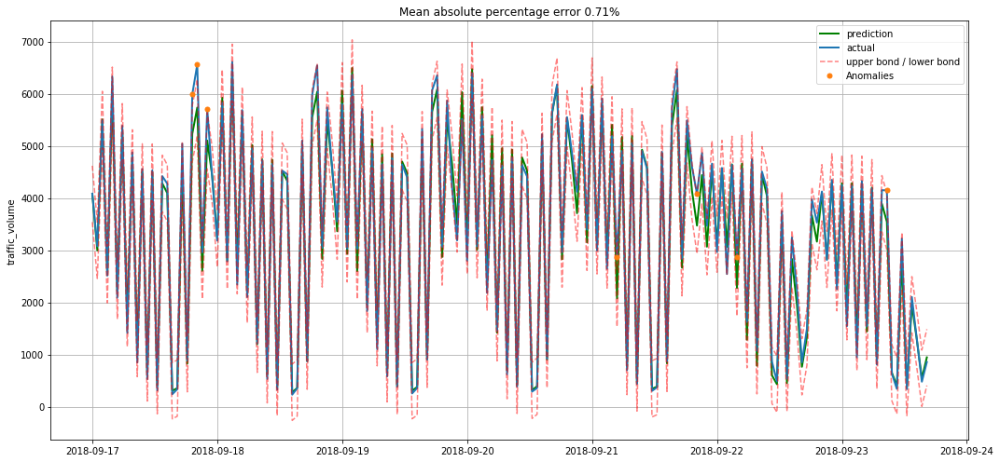

In [54]:
y_pred = train.groupby(["weekday", "sin_time", "cos_time"])["traffic_volume"].mean()
y_true = test.groupby(["weekday", "sin_time", "cos_time"])["traffic_volume"].mean()

quality = {'Baseline': {
    'mean_absolute_error': mean_absolute_error(y_true, y_pred),
    'median_absolute_error': median_absolute_error(y_true, y_pred),
    'mean_absolute_percentage_error': mean_absolute_percentage_error(y_true, y_pred),
    'mean_squared_error': mean_squared_error(y_true, y_pred)
}}

def print_quality(model):
    pprint(model)
    print(*[f'{k} \t {v}' for k, v in quality[model].items()], sep='\n')
    
print_quality('Baseline')

fig = plt.figure(figsize=(15, 7))
ax = fig.add_subplot(111)
ax.plot(y_pred.values, "g", label="prediction", linewidth=2.0)
ax.plot(y_true.values, label="actual", linewidth=2.0)

mae = train['traffic_volume'].mean() * (-1)
deviation = train['traffic_volume'].std()
scale = 1.96
lower = y_pred - (mae + scale * deviation)
upper = y_pred + (mae + scale * deviation)
ax.plot(lower.values, "r--", label="upper bond / lower bond", alpha=0.5)
ax.plot(upper.values, "r--", alpha=0.5)

anomalies = np.array([np.NaN]*len(y_true))
anomalies[y_true<lower] = y_true[y_true<lower]
anomalies[y_true>upper] = y_true[y_true>upper]
ax.plot(anomalies, "o", markersize=5, label = "Anomalies")

labels = [item.get_text() for item in ax.get_xticklabels()]
labels = [0]+[i for ix, i in enumerate(test['date_time'].dt.date.values) if ix%25==0]
ax.set_xticklabels(labels)
plt.ylabel('traffic_volume')

error = mean_absolute_percentage_error(y_pred, y_true)
plt.title("Mean absolute percentage error {0:.2f}%".format(error))
plt.legend(loc="best")
plt.tight_layout()
plt.grid(True)

# Prophet

In [40]:
from fbprophet import Prophet

In [55]:
test.head()

,date_time,traffic_volume,holiday,temp,weekday,sin_time,cos_time
52215,2018-09-17 00:00:00,550.0,0,296.58,0,0.000000,1.000000
52216,2018-09-17 01:00:00,280.0,0,296.19,0,0.258819,0.965926
52217,2018-09-17 02:00:00,260.0,0,295.82,0,0.500000,0.866025
52218,2018-09-17 03:00:00,344.0,0,295.83,0,0.707107,0.707107
52219,2018-09-17 04:00:00,880.0,0,295.68,0,0.866025,0.500000


In [42]:
# creating a specific format dataset 
train_df = train[['date_time', 'traffic_volume']].copy()
train_df.columns = ['ds', 'y']

test_df = test[['date_time', 'traffic_volume']].copy()
test_df.columns = ['ds', 'y']

train_df.tail()

,ds,y
52210,2018-09-16 19:00:00,3400.0
52211,2018-09-16 20:00:00,3092.0
52212,2018-09-16 21:00:00,2623.0
52213,2018-09-16 22:00:00,1725.0
52214,2018-09-16 23:00:00,1088.0


In [43]:
# declaring the model, it's necessary to pay attention to seasonality type we want to use
model = Prophet(weekly_seasonality=True, yearly_seasonality=True)
model.fit(train_df)

# number of future predictions
predictions = 24*7*2

# creating one more specific dataset for predictions
# we also need to set data frequency here (by default - days)
future = model.make_future_dataframe(periods=predictions, freq='H')
future.tail()

,ds
17515,2018-09-30 19:00:00
17516,2018-09-30 20:00:00
17517,2018-09-30 21:00:00
17518,2018-09-30 22:00:00
17519,2018-09-30 23:00:00


In [44]:
# finally, making predictions
forecast = model.predict(future)
forecast.tail()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,daily,...,weekly,weekly_lower,weekly_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
17515,2018-09-30 19:00:00,3300.355416,2306.357033,4422.418347,3299.836446,3300.801728,56.562325,56.562325,56.562325,340.632483,...,-493.380149,-493.380149,-493.380149,209.309991,209.309991,209.309991,0.0,0.0,0.0,3356.917740
17516,2018-09-30 20:00:00,3300.350682,1579.134850,3747.809273,3299.829494,3300.802154,-650.410388,-650.410388,-650.410388,-398.344136,...,-461.415820,-461.415820,-461.415820,209.349568,209.349568,209.349568,0.0,0.0,0.0,2649.940294
17517,2018-09-30 21:00:00,3300.345949,1103.047070,3258.389880,3299.822702,3300.806954,-1116.329728,-1116.329728,-1116.329728,-896.654204,...,-429.061754,-429.061754,-429.061754,209.386229,209.386229,209.386229,0.0,0.0,0.0,2184.016221
17518,2018-09-30 22:00:00,3300.341215,826.195219,2957.750426,3299.815967,3300.806108,-1403.420155,-1403.420155,-1403.420155,-1216.332114,...,-396.508019,-396.508019,-396.508019,209.419978,209.419978,209.419978,0.0,0.0,0.0,1896.921060
17519,2018-09-30 23:00:00,3300.336482,539.432036,2759.412288,3299.809232,3300.804889,-1734.855648,-1734.855648,-1734.855648,-1580.367827,...,-363.938640,-363.938640,-363.938640,209.450819,209.450819,209.450819,0.0,0.0,0.0,1565.480834


In [45]:
y_pred = forecast[-predictions:]['yhat'].reset_index(drop=True)
y_true = test_df['y'].reset_index(drop=True)

quality['Prophet'] = {
    'mean_absolute_error': mean_absolute_error(y_true, y_pred),
    'median_absolute_error': median_absolute_error(y_true, y_pred),
    'mean_absolute_percentage_error': mean_absolute_percentage_error(y_true, y_pred),
    'mean_squared_error': mean_squared_error(y_true, y_pred)
}
print_quality('Prophet')

Prophet
mean_absolute_error 	 611.8385406964627
median_absolute_error 	 472.3959566203421
mean_absolute_percentage_error 	 4.023177689653044
mean_squared_error 	 655064.8620553518


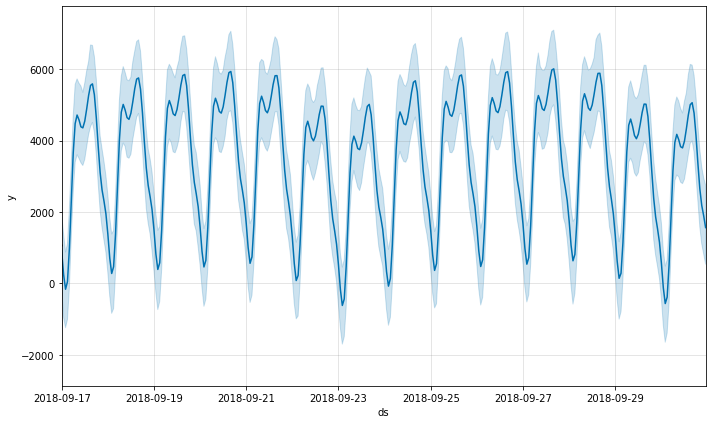

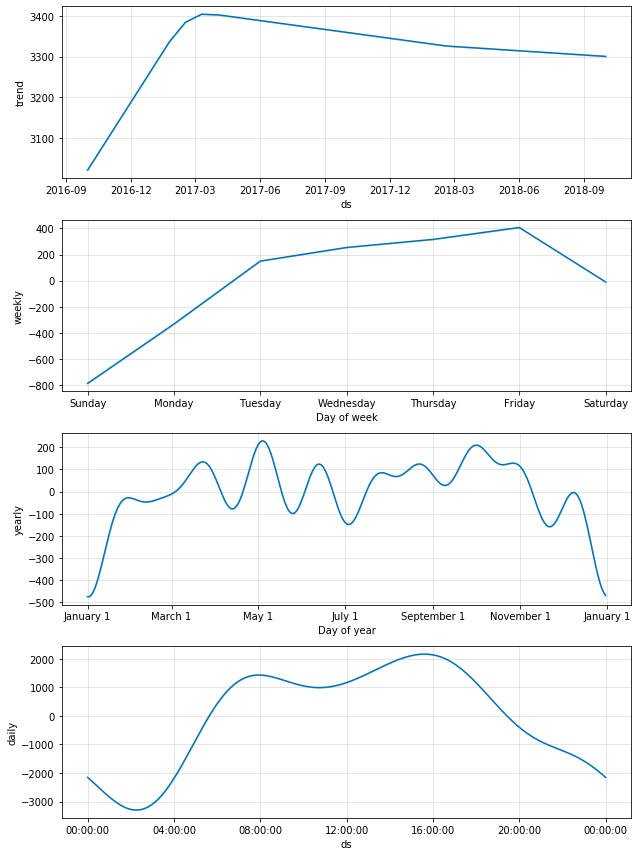

In [46]:
_ = model.plot(forecast)
plt.xlim((forecast[-predictions:]['ds'].min(), forecast[-predictions:]['ds'].max()))
_ = model.plot_components(forecast)

In [48]:
from sklearn.preprocessing import StandardScaler
scaler = StandardScaler()

X_train = train.set_index('date_time').drop('traffic_volume', axis=1).sort_index()
y_train = train.set_index('date_time')['traffic_volume'].sort_index()

X_test = test.set_index('date_time').drop('traffic_volume', axis=1).sort_index()
y_test = test.set_index('date_time')['traffic_volume'].sort_index()

X_train_scaled = scaler.fit_transform(X_train)
X_test_scaled = scaler.transform(X_test)

In [49]:
from sklearn.model_selection import cross_val_score, TimeSeriesSplit
from sklearn.ensemble import GradientBoostingRegressor, AdaBoostRegressor

tscv = TimeSeriesSplit(n_splits=5)

In [50]:
def plotModelResults(model, X_train=X_train, y_train=y_train, X_test=X_test, y_test=y_test,
                     plot_intervals=False, plot_anomalies=False):
    """
        Plots modelled vs fact values, prediction intervals and anomalies
    
    """
    
    prediction = model.predict(X_test)
    
    fig = plt.figure(figsize=(15, 7))
    ax = fig.add_subplot(111)
    ax.plot(prediction, "g", label="prediction", linewidth=2.0)
    ax.plot(y_test.values, label="actual", linewidth=2.0)
    
    if plot_intervals:
        cv = cross_val_score(model, X_train, y_train, 
                                    cv=tscv, 
                                    scoring="neg_mean_absolute_error")
        mae = cv.mean() * (-1)
        deviation = cv.std()
        
        scale = 1.96
        lower = prediction - (mae + scale * deviation)
        upper = prediction + (mae + scale * deviation)
        
        ax.plot(lower, "r--", label="upper bond / lower bond", alpha=0.5)
        ax.plot(upper, "r--", alpha=0.5)
        
        if plot_anomalies:
            anomalies = np.array([np.NaN]*len(y_test))
            anomalies[y_test<lower] = y_test[y_test<lower]
            anomalies[y_test>upper] = y_test[y_test>upper]
            ax.plot(anomalies, "o", markersize=5, label = "Anomalies")
            
    labels = [item.get_text() for item in ax.get_xticklabels()]
    date_range = pd.date_range(start=y_test.index.min(), freq='H', periods=351)
    labels = [0]+[i for ix, i in enumerate(date_range) if ix%50==0]
    ax.set_xticklabels(labels)
    plt.ylabel('traffic_volume')
    
    error = mean_absolute_percentage_error(prediction, y_test)
    plt.title("Mean absolute percentage error {0:.2f}%".format(error))
    plt.legend(loc="best")
    plt.tight_layout()
    plt.grid(True)

# AdaBoostRegressor

AdaBoostRegressor
mean_absolute_error 	 865.4028983511432
median_absolute_error 	 610.8489052240839
mean_absolute_percentage_error 	 4.9794500397823915
mean_squared_error 	 1227981.0509241559


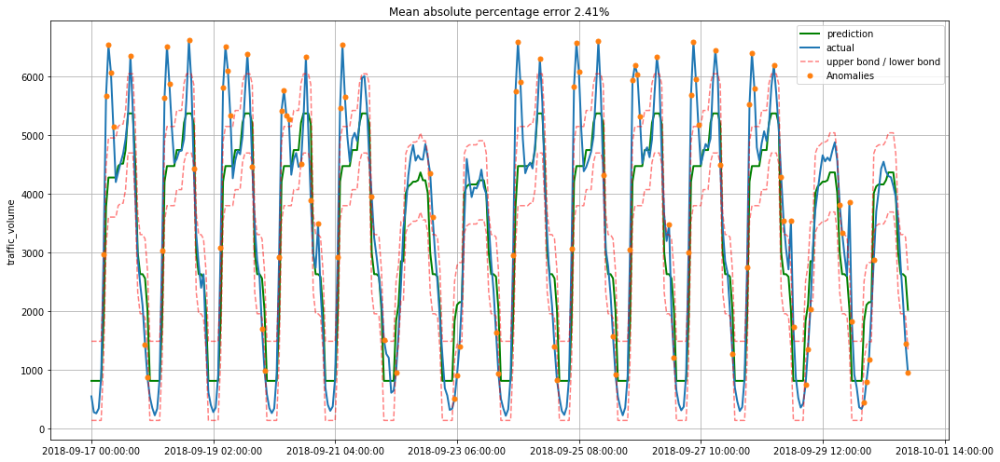

In [51]:
abr = AdaBoostRegressor(n_estimators=1000)
abr.fit(X_train_scaled, y_train)

y_pred = abr.predict(X_test)
y_true = y_test

quality['AdaBoostRegressor'] = {
    'mean_absolute_error': mean_absolute_error(y_true, y_pred),
    'median_absolute_error': median_absolute_error(y_true, y_pred),
    'mean_absolute_percentage_error': mean_absolute_percentage_error(y_true, y_pred),
    'mean_squared_error': mean_squared_error(y_true, y_pred)
}
print_quality('AdaBoostRegressor')

plotModelResults(abr, 
                 X_train=X_train_scaled,
                 y_train=y_train,
                 X_test=X_test_scaled,
                 y_test=y_test,
                 plot_intervals=True, plot_anomalies=True)

AdaBoostRegressor отрабатывает быстро, но качество предсказания сильно хуже, так как AdaBoostRegressor сильно сглаживает пики. Увеличение числа n_estimators со 100 до 1000 не привело к улучшению.

# GradientBoostingRegressor

GradientBoostingRegressor
mean_absolute_error 	 1198.229832665903
median_absolute_error 	 991.8780414338349
mean_absolute_percentage_error 	 4.3238684141597545
mean_squared_error 	 2493924.8334172424


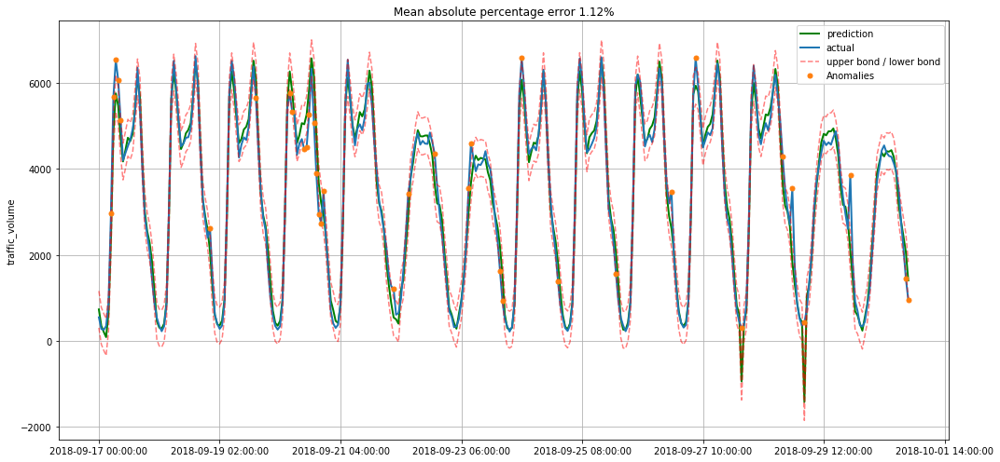

In [52]:
gbr = GradientBoostingRegressor(n_estimators=1000)
gbr.fit(X_train_scaled, y_train)

y_pred = gbr.predict(X_test)
y_true = y_test

quality['GradientBoostingRegressor'] = {
    'mean_absolute_error': mean_absolute_error(y_true, y_pred),
    'median_absolute_error': median_absolute_error(y_true, y_pred),
    'mean_absolute_percentage_error': mean_absolute_percentage_error(y_true, y_pred),
    'mean_squared_error': mean_squared_error(y_true, y_pred)
}
print_quality('GradientBoostingRegressor')

plotModelResults(gbr, 
                 X_train=X_train_scaled, 
                 X_test=X_test_scaled, 
                 plot_intervals=True, plot_anomalies=True)

GradientBoostingRegressor в отличие от AdaBoostRegressor более чувствителен к пикам, и качество предсказания значительно увеличилось при повышении числа итераций со 100 до 1000.

,Baseline,Prophet,AdaBoostRegressor,GradientBoostingRegressor
mean_absolute_error,172.326787,611.838541,8.654029e+02,1.198230e+03
median_absolute_error,108.235294,472.395957,6.108489e+02,9.918780e+02
mean_absolute_percentage_error,0.709825,4.023178,4.979450e+00,4.323868e+00
mean_squared_error,59515.743115,655064.862055,1.227981e+06,2.493925e+06


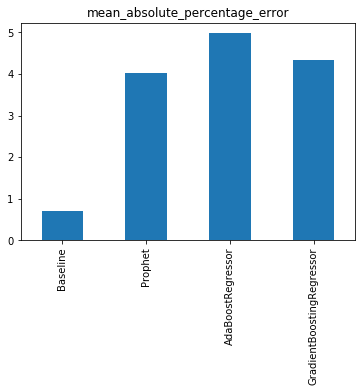

In [53]:
quality_df = pd.DataFrame().from_dict(quality)
quality_df.loc['mean_absolute_percentage_error'].plot(kind='bar')
plt.title('mean_absolute_percentage_error')
quality_df

Качество baseline модели оказалось наилучшим, возможно это связано с тем, что модели пытаются выявить закономерность на всех данных, и поэтому соседние данные могут смазывать пиковые значения траффика, в то время как пиковые нагрузки слишком резкие и сильно зависят от часа дня.